# 音声分離モデル比較実験ノートブック

このノートブックでは、複数の音声分離モデル（DCUNet、ResUNetなど）の性能を比較評価します。

## 概要
- **目的**: 異なるアーキテクチャの音声分離モデルの性能比較
- **評価指標**: SDR（Signal-to-Distortion Ratio）、SDRi（SDR improvement）、処理時間
- **データ**: シミュレートされた室内音響環境での混合音声

## 実験の流れ
1. 🏠 **室内音響シミュレーション**: pyroomacousticsを使用して部屋の音響特性をモデル化
2. 🎵 **混合信号の生成**: ターゲット音声とノイズの混合信号を作成
3. 🤖 **モデル読み込み**: 複数の音声分離モデルを読み込み
4. 📊 **性能評価**: 各モデルの分離性能と処理時間を測定
5. 📈 **結果分析**: pandas DataFrameを用いた統計分析と可視化
6. 🏆 **最良モデル選定**: SDRiに基づく最良モデルの特定

## 0. ライブラリのインポート

必要なライブラリを読み込みます：
- **pyroomacoustics**: 室内音響シミュレーション
- **soundfile**: 音声ファイルの読み書き
- **wandas**: 音声信号の可視化・分析
- **torchmetrics**: 音声評価指標（SDR）の計算
- **pandas**: データ分析・管理
- **matplotlib**: グラフ描画

In [1]:
import numpy as np
import pyroomacoustics as pra
import librosa
import os
import time
import pandas as pd
import matplotlib.pyplot as plt
from wandas import ChannelFrame
from torchmetrics.audio.sdr import (
    signal_distortion_ratio as sdr,
)
import torch
from sounddiffsep.model_loader import easy_load_model, separate_audio

## 1. 室内音響環境のシミュレーション

現実的な音響環境での音声分離性能を評価するため、pyroomacousticsを使用して室内の音響特性をシミュレートします。

### 設定パラメータ
- **部屋のサイズ**: 8m × 8mの正方形の部屋
- **壁面吸収率**: 0.4
- **散乱率**: 0.1
- **反射次数**: 最大12次まで
- **マイク配置**: 2チャンネルの分散配置
- **音源**: ターゲット音源とノイズ音源を異なる位置に配置

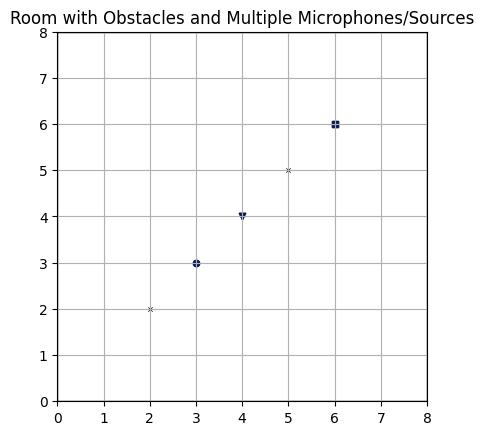

In [2]:
data_dir = "../data"
fs = 32000
duration = 10
source_audio_files = [
    "target.flac", 
    "noise1.flac", 
    "noise2.flac"
]
source_audio_files = [os.path.join(data_dir, f) for f in source_audio_files]
assert all(os.path.exists(f) for f in source_audio_files), "音声ファイルが見つかりません"

source_signals = np.array([librosa.load(file, sr=fs, duration=duration, mono=True)[0] for file in source_audio_files])
source_signals /= source_signals.std(-1, keepdims=True)
source_signals /= source_signals.max()

# 部屋の形状を設定（角の座標）
corners = np.array([
    [0, 0], [8, 0], [8, 8], [0, 8]
]).T  # 転置して [2, N] の形に

# 壁の吸収率を設定
absorption = 0.4  # 吸収率
scattering = 0.1  # 散乱率

# 部屋の作成
room = pra.Room.from_corners(
    corners=corners,
    fs=fs,
    materials=pra.Material(absorption, scattering),
    max_order=12  # 反射の最大回数
)
# マイクを配置
mic_positions = np.array([[2.0, 2.0], [5.0, 5.0]]).T  # 2つのマイクの座標
room.add_microphone_array(mic_positions)

# 音源を配置
# 音源配置と信号追加
source_positions = [[3.0, 3.0], [6.0, 6.0], [4.0, 4.0]]  # 3つの音源の座標
for position, signal in zip(source_positions, source_signals):
    room.add_source(position, signal=signal)

# 描画
fig, ax = room.plot()
ax.set_title("Room with Obstacles and Multiple Microphones/Sources")
ax.grid()
plt.show()



[2.0, 2.0]に配置されたマイクの収録音から[3,3]に配置された音源を強調します。

## 2. 混合信号の生成

設定した室内環境で音響シミュレーションを実行し、以下の信号を生成します：
- **混合信号** (`mixed_mic1`, `mixed_mic2`): ターゲット音源 + ノイズ音源
- **クリーン信号** (`clean_mic1`, `clean_mic2`): ターゲット音源のみ

これらの信号は音声分離モデルの入力と正解データとして使用されます。

In [3]:
# シミュレーション実行
room.simulate()
mix_signals = room.mic_array.signals
clean_signals = room.simulate(return_premix=True)

val_signal = ChannelFrame.from_ndarray(
    np.vstack((mix_signals, clean_signals[0,0,None])), 
    sampling_rate=fs, 
    labels=["mixed_mic1", "mixed_mic2"]+["clean_mic1"])


from_ndarray is deprecated. Use from_numpy instead.


### 生成された信号の分析

`wandas.ChannelFrame`を使用して生成された音声信号の時間波形とスペクトログラムを可視化します。この可視化により、混合信号の特性とクリーン信号との違いを確認できます。

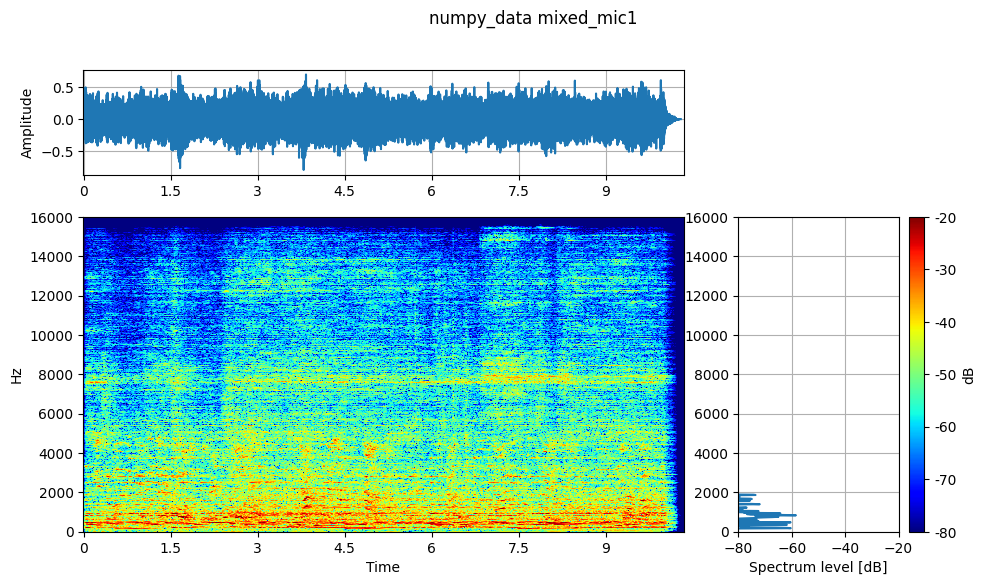

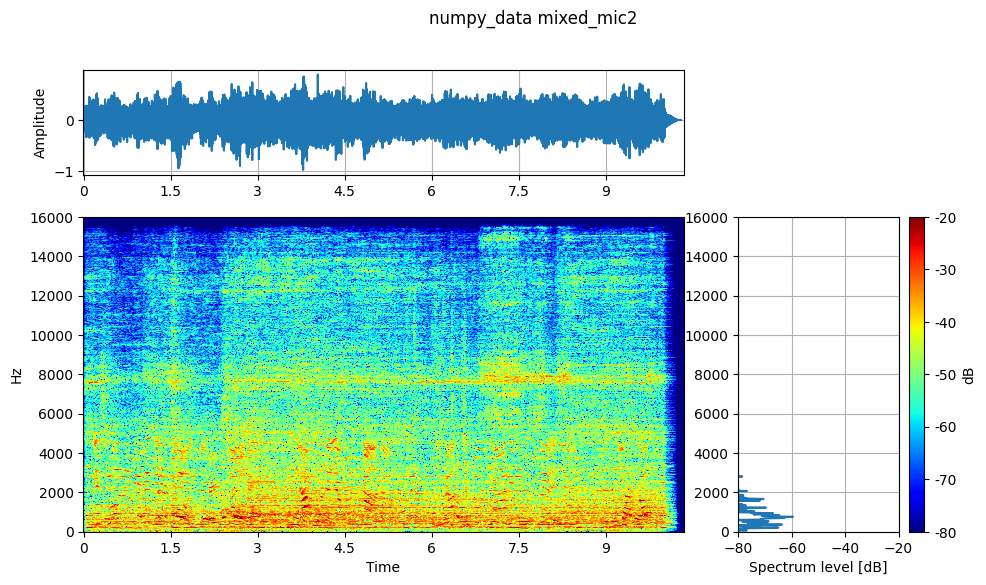

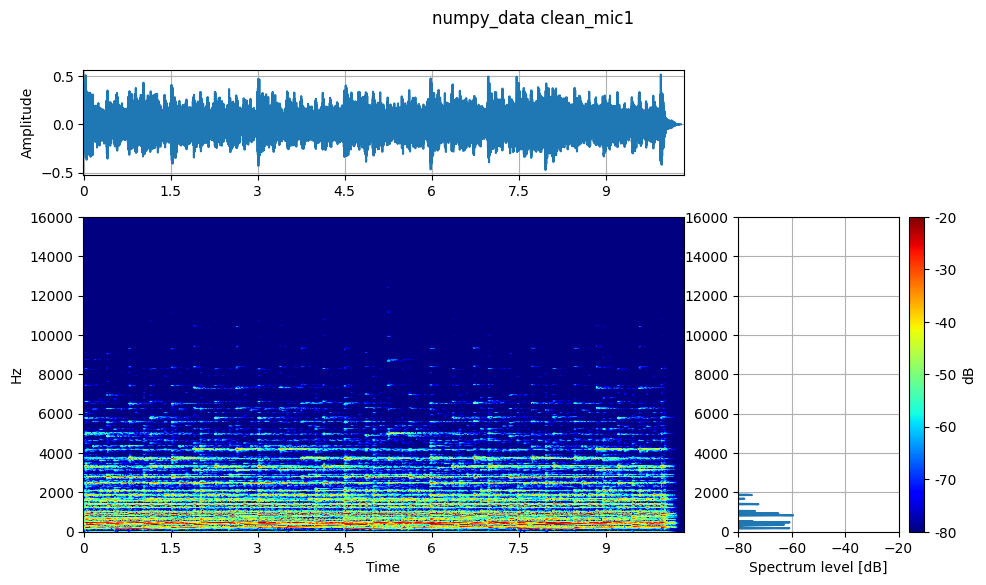

In [4]:
val_signal.describe(vmax=-20, vmin=-80)

## 3. モデルの読み込み

SoundDiffSepライブラリから複数の事前学習済み音声分離モデルを読み込みます。

### 評価対象モデル
- **DCUNet-16**: 軽量版DCUNet（16チャンネル）
- **DCUNet-16-4096**: DCUNet-16の高解像度版
- **DCUNet-20**: 標準DCUNet（20チャンネル）
- **Large-DCUNet-20**: 大規模DCUNet
- **ResUNet**: ResidualブロックベースのU-Net

各モデルはCUDAデバイス上に読み込まれ、パラメータ数も表示されます。

In [5]:


device = "cuda"  # "cuda" if torch.cuda.is_available() else "cpu"

print(f"Using device: {device}")

models = {}
results_data = []  # 結果を格納するリスト

for model_type in ["DCUNet-16", "DCUNet-16-4096", "DCUNet-20", "Large-DCUNet-20", "resunet"]:
    print(f"Loading model: {model_type}")
    
    models[model_type] = easy_load_model(model_type, device=device)
    # パラメータ数の表示
    num_params = sum(p.numel() for p in models[model_type].parameters())
    
    # 結果データに基本情報を追加
    results_data.append({
        'Model': model_type,
        'Parameters': num_params,
        'SDRi': None,
        'SDR': None,
        'Processing_Time': None
    })

Using device: cuda
Loading model: DCUNet-16
DCUNet チェックポイントの最初の数個のキー: ['model.encoder.filterbank._filters', 'model.encoder.filterbank.torch_window', 'model.masker.encoders.0.conv.re_module.weight']
DCUNet 調整後のキー数: 188
Loading model: DCUNet-16-4096
DCUNet チェックポイントの最初の数個のキー: ['model.encoder.filterbank._filters', 'model.encoder.filterbank.torch_window', 'model.masker.encoders.0.conv.re_module.weight']
DCUNet 調整後のキー数: 188
Loading model: DCUNet-20
DCUNet チェックポイントの最初の数個のキー: ['model.encoder.filterbank._filters', 'model.encoder.filterbank.torch_window', 'model.masker.encoders.0.conv.re_module.weight']
DCUNet 調整後のキー数: 236
Loading model: Large-DCUNet-20
DCUNet チェックポイントの最初の数個のキー: ['model.encoder.filterbank._filters', 'model.encoder.filterbank.torch_window', 'model.masker.encoders.0.conv.re_module.weight']
DCUNet 調整後のキー数: 236
Loading model: resunet
チェックポイントの最初の数個のキー: ['ss_model.base.stft.conv_real.weight', 'ss_model.base.stft.conv_imag.weight', 'ss_model.base.istft.ola_window']
調整後のキー数: 256


## 4. 性能評価

各モデルに対して音声分離を実行し、以下の指標で性能を評価します：

### 評価指標
- **SDR (Signal-to-Distortion Ratio)**: 分離後の信号品質
- **SDRi (SDR improvement)**: 分離前後でのSDRの改善度
- **処理時間**: 分離処理にかかる時間

結果はpandas DataFrameで管理され、後の分析で使用されます。

In [6]:
# 全モデルで分離を実行, 実行時間と分離性能を表示
mixed, noise = val_signal["mixed_mic1"].data, val_signal["mixed_mic2"].data
tgt = val_signal["clean_mic1"].data

# 結果を格納するためのDataFrame作成
results_df = pd.DataFrame(results_data)

for i, (model_type, model) in enumerate(models.items()):
    print(f"Processing with model: {model_type}")

    # 一回推論を回す。
    _ = separate_audio(model=model, mixed_signal=mixed, noise_signal=noise, device=device)

    start_time = time.time()
    result = separate_audio(model=model, mixed_signal=mixed, noise_signal=noise, device=device)
    end_time = time.time()
    processing_time = end_time - start_time

    # 結果の処理　sdri sdrを計算
    obs_sdr = sdr(torch.from_numpy(mixed), torch.from_numpy(tgt))
    est_sdr = sdr(torch.from_numpy(result["estimated_target"][0]), torch.from_numpy(tgt))
    sdri = est_sdr - obs_sdr
    
    # DataFrameに結果を更新
    results_df.loc[i, 'SDRi'] = sdri.item()
    results_df.loc[i, 'SDR'] = est_sdr.item()
    results_df.loc[i, 'Processing_Time'] = processing_time
    

Processing with model: DCUNet-16
Processing with model: DCUNet-16-4096
Processing with model: DCUNet-20
Processing with model: Large-DCUNet-20
Processing with model: resunet


## 5. 結果分析

評価結果をpandas DataFrameで整理し、複数の観点から分析します：

### 分析内容
- **性能順ランキング**: SDRi（改善度）による順位付け
- **処理速度分析**: 実用性の観点からの処理時間評価
- **モデル比較**: 各モデルの特徴と性能のトレードオフ

In [7]:
# 結果の詳細分析と可視化
print("=== 詳細結果分析 ===")

# SDRiでソート
results_sorted = results_df.sort_values('SDRi', ascending=False)
print("\n📊 SDRi（改善度）順:")
print(results_sorted[['Model', 'SDRi', 'SDR', 'Processing_Time']].to_string(index=False))

print("\n🚀 処理時間順:")
speed_sorted = results_df.sort_values('Processing_Time', ascending=True)
print(speed_sorted[['Model', 'SDRi', 'SDR', 'Processing_Time']].to_string(index=False))



=== 詳細結果分析 ===

📊 SDRi（改善度）順:
          Model      SDRi       SDR Processing_Time
        resunet  7.381124  7.045728        0.053556
Large-DCUNet-20  6.540401  6.205006        0.166403
      DCUNet-20  6.141097  5.805701        0.091081
      DCUNet-16  5.677523  5.342127        0.029787
 DCUNet-16-4096  5.456285  5.120889        0.013155

🚀 処理時間順:
          Model      SDRi       SDR Processing_Time
 DCUNet-16-4096  5.456285  5.120889        0.013155
      DCUNet-16  5.677523  5.342127        0.029787
        resunet  7.381124  7.045728        0.053556
      DCUNet-20  6.141097  5.805701        0.091081
Large-DCUNet-20  6.540401  6.205006        0.166403


### 結果の可視化

matplotlibを使用して評価結果をグラフで可視化します：

1. **左図**: モデルサイズ（パラメータ数） vs SDRi、色は処理時間を表現
2. **右図**: 処理時間 vs SDRi、実用性と性能のトレードオフを可視化

これにより、モデル選択の指針となる情報を視覚的に把握できます。

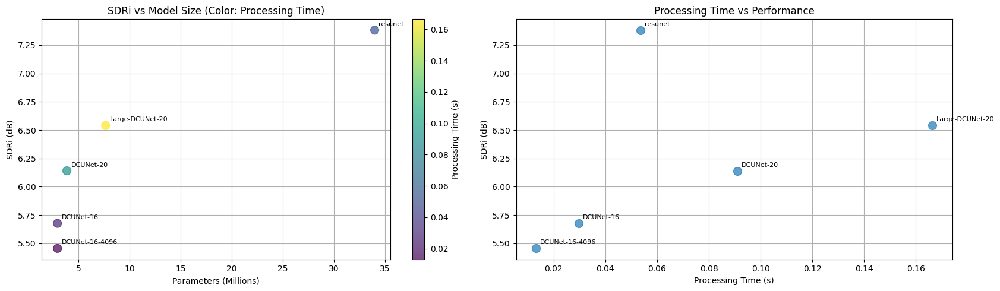

In [8]:
# 結果の可視化
fig, axes = plt.subplots(1, 2, figsize=(17, 5))

# SDRi vs パラメータ数
ax1 = axes[0]
scatter = ax1.scatter(results_df['Parameters']/1e6, results_df['SDRi'], 
                     c=results_df['Processing_Time'], cmap='viridis', s=100, alpha=0.7)
ax1.set_xlabel('Parameters (Millions)')
ax1.set_ylabel('SDRi (dB)')
ax1.set_title('SDRi vs Model Size (Color: Processing Time)')
plt.colorbar(scatter, ax=ax1, label='Processing Time (s)')
for i, model in enumerate(results_df['Model']):
    ax1.annotate(model, (results_df['Parameters'].iloc[i]/1e6, results_df['SDRi'].iloc[i]), 
                xytext=(5, 5), textcoords='offset points', fontsize=8)
ax1.grid()

# 処理時間 vs SDRi
ax2 = axes[1]
ax2.scatter(results_df['Processing_Time'], results_df['SDRi'], s=100, alpha=0.7)
ax2.set_xlabel('Processing Time (s)')
ax2.set_ylabel('SDRi (dB)')
ax2.set_title('Processing Time vs Performance')
for i, model in enumerate(results_df['Model']):
    ax2.annotate(model, (results_df['Processing_Time'].iloc[i], results_df['SDRi'].iloc[i]), 
                xytext=(5, 5), textcoords='offset points', fontsize=8)
ax2.grid()
plt.tight_layout()
plt.show()

## 6. 最良モデル選定

SDRi（改善度）が最も高いモデルを特定し、その分離結果を詳細に分析します。

### 分析内容
- 最良モデルの特定
- 分離音声の生成
- 時間波形とスペクトログラムによる分離品質の確認
- エラー信号の分析

In [9]:
# 分離性能が一番いいモデルの分離結果を表示

# SDRiが最大のインデックスを取得
best_model_index = results_df['SDRi'].astype(float).idxmax()
best_model_name = results_df.loc[best_model_index, 'Model']
best_model = models[best_model_name]
print(f"Best model: {best_model_name}")

# 最良モデルの結果を表示
result = separate_audio(model=best_model, mixed_signal=mixed, noise_signal=noise, device=device)

sep_signal = ChannelFrame.from_numpy(
    np.stack([mixed, tgt, result["estimated_target"][0], result["estimated_noise"][0], tgt - result["estimated_target"][0]], axis=0),
    sampling_rate=fs,
    ch_labels=["mixed_mic1", "clean_mic1", "est_tgt", "est_noise", "clean_mic1-est_tgt"],
    label=best_model_name
)


Best model: resunet


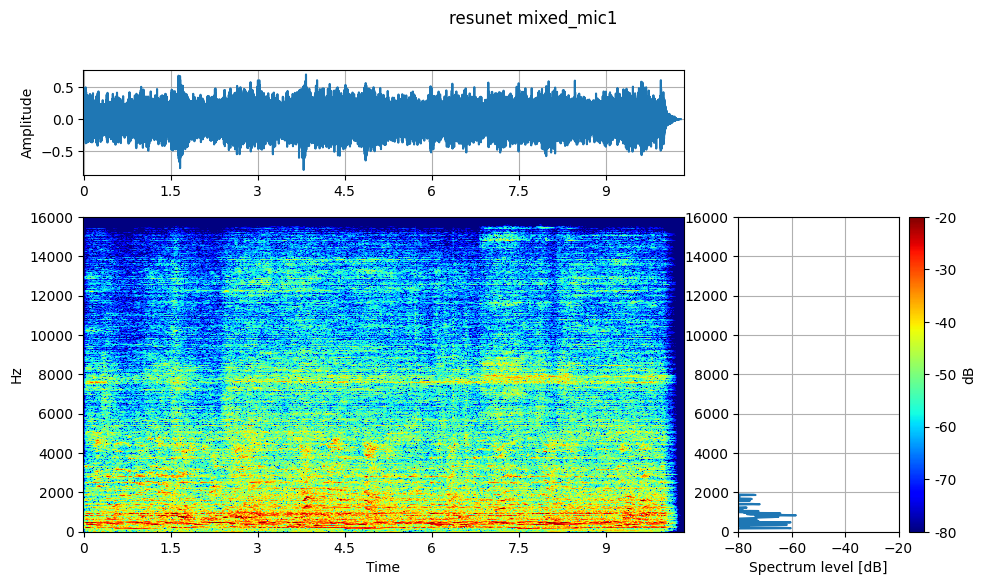

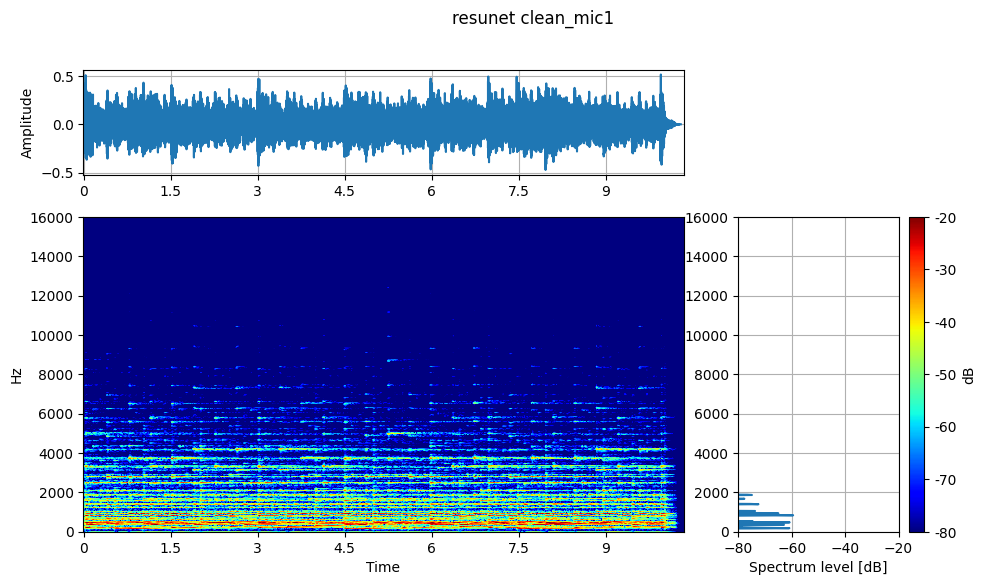

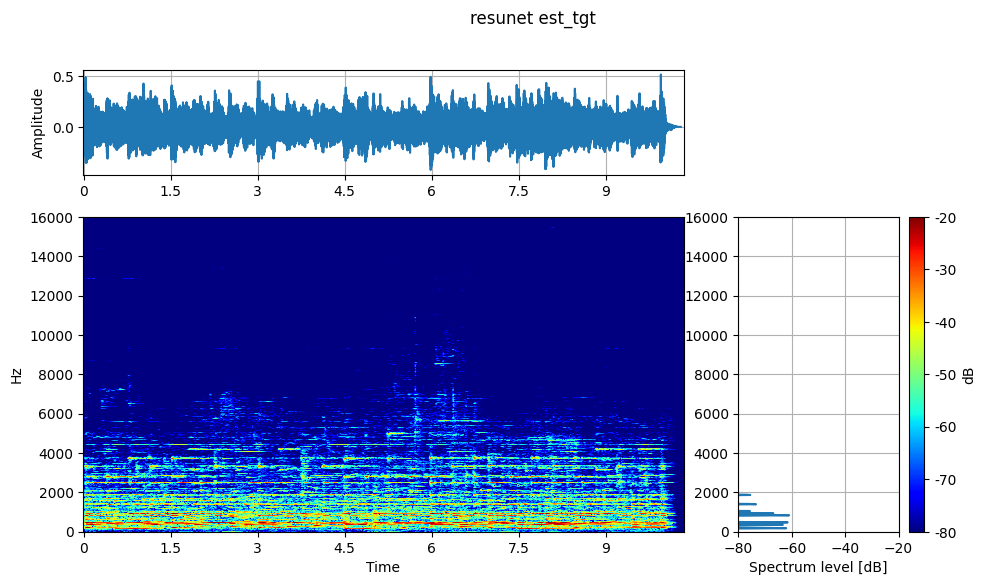

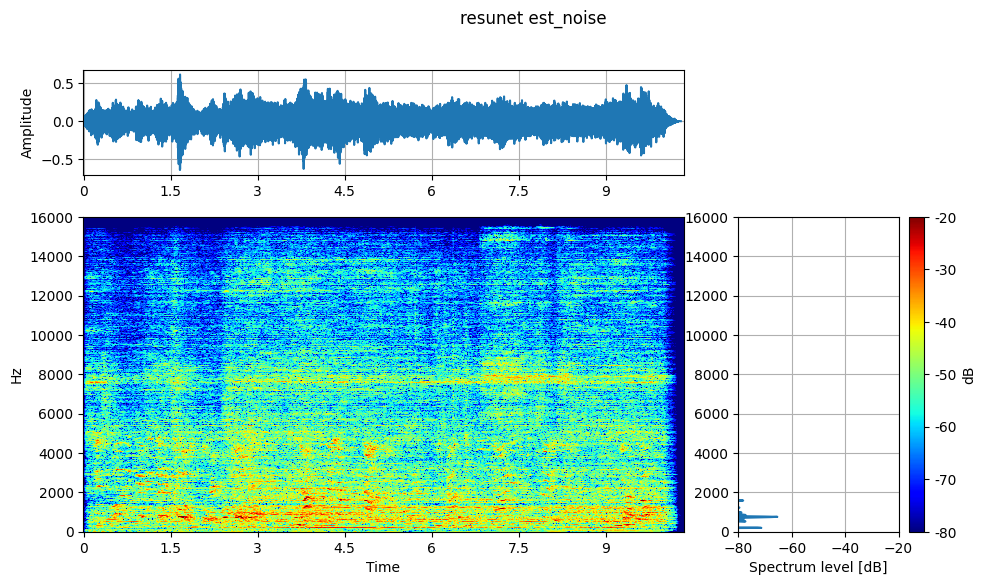

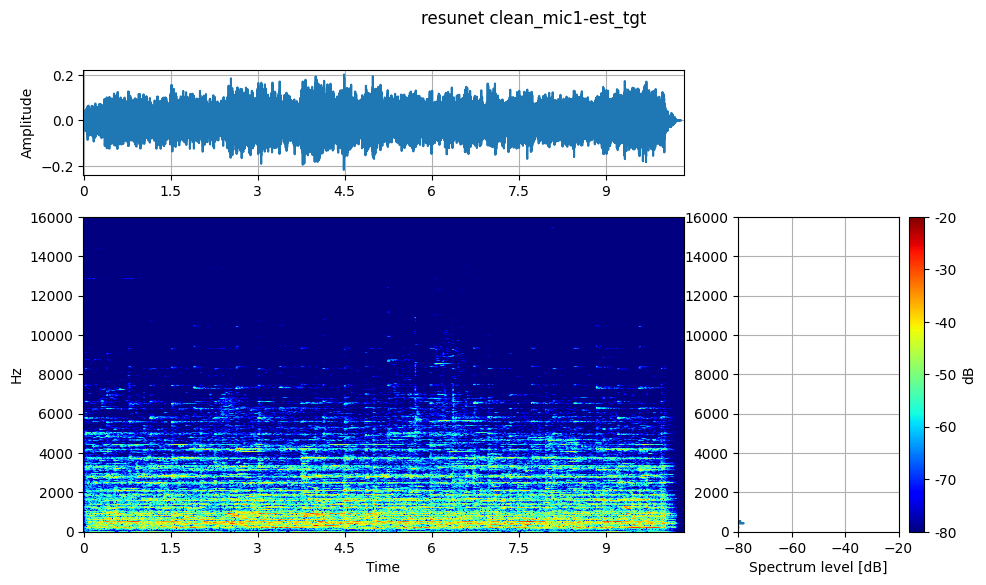

In [10]:
sep_signal.describe(vmax=-20, vmin=-80)

## 7. 実験結果の総括

この実験により、以下の知見が得られました：

### 主要な発見
1. **性能**: 各モデルのSDRi（改善度）と絶対的なSDR性能の比較
2. **効率性**: パラメータ数と性能のトレードオフ関係
3. **実用性**: 処理時間と性能のバランス
4. **最適解**: 総合的な評価による最良モデルの特定

### 実用的な指針
- **高性能重視**: 最高のSDRiを達成するモデル
- **バランス重視**: 性能・速度・モデルサイズのバランスが良いモデル
- **リアルタイム用途**: 処理速度を重視する場合の推奨モデル

この結果は音声分離システムの実装時のモデル選択に活用できます。

### 分離結果の詳細可視化

最良モデルによる分離結果を`wandas.ChannelFrame`で可視化します：

- **mixed_mic1**: 元の混合信号
- **clean_mic1**: 正解（クリーン信号）
- **est_tgt**: 推定されたターゲット信号
- **error**: 推定誤差（正解 - 推定）
- **est_noise**: 推定されたノイズ信号

時間波形とスペクトログラムの両方で分離品質を確認できます。